**TRABALHO DE CONCLUSÃO DE CURSO - TCC**
---
PUC Minas - Pontifícia Universidade Católica de Minas Gerais

Pós-Graduação em Ciência de Dados e Big Data

**Aluno**: Daniel Eliton Costa

**Matrícula**: 1223582

Tema: Análise sobre os Acidentes nas Rodovias Federais do Brasil entre 2017 a 2020

# 1. Importar Bibliotecas

In [1]:
!pip install folium

In [2]:
# Importando bibliotecas
import os
import time
from random import randint
import requests
import itertools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from pandas import json_normalize

sns.set(style="whitegrid")

%matplotlib inline

# from sklearn.externals import joblib
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, make_scorer
from sklearn.metrics import f1_score, classification_report
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import pickle
import _pickle

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMapWithTime
from folium.plugins import HeatMap
from folium import plugins

Criar pasta dataset para onde o resultado deste dataset vai ser salvo

In [3]:
# Criar pasta dataset                                                           
path = r"datasets"
if not(os.path.exists(path)):
  os.makedirs(path)

In [4]:
import matplotlib.pyplot as plt                                                 
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# 2 Coleta de Dados#

## 2.1. PRF##

### 2.1.1 Agrupados por ocorrência###

Conjunto de dados da PRF(Policia Rodoviária Federal) com 
ocorrências nas estradas federais brasileiras.

In [5]:
cols = ['id', 'data_inversa', u'dia_semana', 'horario', u'municipio' ,'uf', 'br', 'km', u'causa_acidente', 
        u'tipo_acidente', u'fase_dia',u'condicao_metereologica', u'tracado_via', u'uso_solo', 
        u'classificacao_acidente', 'pessoas', 'mortos', 'feridos_leves','tipo_pista',
        'feridos_graves', 'ilesos', 'feridos', 'veiculos', u'sentido_via', 'latitude', 'longitude']
      
url_oco_2017 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/datatran2017.zip?raw=true'
url_oco_2018 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/datatran2018.zip?raw=true'
url_oco_2019 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/datatran2019.zip?raw=true'
url_oco_2020 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/datatran2020.zip?raw=true'

df_ocorrencias_2017 = pd.read_csv(url_oco_2017, sep=';',encoding="ISO-8859-1", compression='zip', usecols=cols)
df_ocorrencias_2018 = pd.read_csv(url_oco_2018, sep=';',encoding="ISO-8859-1", compression='zip', usecols=cols)
df_ocorrencias_2019 = pd.read_csv(url_oco_2019, sep=';',encoding="ISO-8859-1", compression='zip', usecols=cols)
df_ocorrencias_2020 = pd.read_csv(url_oco_2020, sep=';',encoding="ISO-8859-1", compression='zip', usecols=cols)


### 2.1.2 Agrupados por pessoa

Conjunto de dados da PRF(Policia Rodoviária Federal) com pessoas envolvidas em ocorrências nas estradas federais brasileiras.

In [6]:
cols = ['id', 'pesid', u'tipo_envolvido', u'estado_fisico', 'idade', u'sexo']

url_pes_2017 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/acidentes2017.zip?raw=true'
url_pes_2018 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/acidentes2018.zip?raw=true'
url_pes_2019 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/acidentes2019.zip?raw=true'
url_pes_2020 = 'https://github.com/callacius/TCC_Puc_mg/blob/main/datasets/baixados/PRF/acidentes2020.zip?raw=true'

df_pessoas_2017 = pd.read_csv(url_pes_2017, sep=';', encoding="ISO-8859-1", compression='zip', usecols=cols)
df_pessoas_2018 = pd.read_csv(url_pes_2018, sep=';', encoding="ISO-8859-1", compression='zip', usecols=cols)
df_pessoas_2019 = pd.read_csv(url_pes_2019, sep=';', encoding="ISO-8859-1", compression='zip', usecols=cols)
df_pessoas_2020 = pd.read_csv(url_pes_2020, sep=';', encoding="utf-8", compression='zip', usecols=cols)


## 2.2 IBGE

Conjunto de dados do IBGE onde foi utilizada a API do IBGE para obter um dataset com informações do código IBGE, junto com dados de região, microrregião e mesorregião.

In [7]:
cols = [u'id', u'nome', u'microrregiao.mesorregiao.UF.sigla', u'regiao-imediata.regiao-intermediaria.UF.regiao.id',
        u'regiao-imediata.regiao-intermediaria.UF.regiao.sigla', u'regiao-imediata.regiao-intermediaria.UF.regiao.nome',
        u'microrregiao.id', u'microrregiao.nome', u'microrregiao.mesorregiao.id', u'microrregiao.mesorregiao.nome']

ufs = ['AC','AL','AP','AM','BA','CE','DF','ES','GO','MA','MT','MS','MG','PA','PB','PR','PE','PI','RJ','RN','RS',
       'RO','RR','SC','SP','SE','TO']

df_ibge = pd.DataFrame(columns=cols)

for uf in ufs:
  url = f"https://servicodados.ibge.gov.br/api/v1/localidades/estados/{uf}/municipios"
  data = requests.get(url)
  df = pd.DataFrame(json_normalize(data.json()),columns=cols)
  df_ibge = pd.concat([df_ibge, df])
  

## 2.3. AMBIMA##

Conjunto da dados da Anbima(Associação Brasileira das Entidades dos Mercados Financeiro e de Capitais) sobre todos os feriados nacionais de 2001 a 2078.

In [8]:
url = 'https://www.anbima.com.br/feriados/arqs/feriados_nacionais.xls'
df_feriados = pd.read_excel(url, nrows=936)


# 3 Processamento/tratamento dos dados#

O tratamento dos dados foi separado em quatro, foi feito o tratamento por fonte de dados para depois fazer a junção de ambos. Este processamento foi dividido em ocorrências, pessoas, IBGE e feriados.

##3.1 Tratamento de df_ocorrencias##

Correção e tratamento do dataset "df_ocorrencias"

In [9]:
# Acrescentar o ano conforme o ano coletado no dataset
df_ocorrencias_2017['ano'] = 2017
df_ocorrencias_2018['ano'] = 2018
df_ocorrencias_2019['ano'] = 2019
df_ocorrencias_2020['ano'] = 2020

# Concatenando os datasets para formar um unico dataset "df_ocorrencias"         #
df_ocorrencias = pd.concat([df_ocorrencias_2017, 
                            df_ocorrencias_2018, 
                            df_ocorrencias_2019, 
                            df_ocorrencias_2020], sort = False)

In [10]:
df_ocorrencias.tail()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,feridos,veiculos,latitude,longitude,ano
63543,364615.0,2020-03-20,sexta-feira,09:00:00,RN,304.0,"171,8",ANGICOS,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Simples,Reta,Não,4,0,1,1,2,2,4,"-5,68711053","-36,419458",2020
63544,364810.0,2020-09-12,sábado,23:50:00,BA,116.0,"11,5",VITORIA DA CONQUISTA,Ingestão de Álcool,Colisão lateral,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Sim,3,0,1,0,2,1,2,"-14,87308214","-40,87141514",2020
63545,364817.0,2020-10-30,sexta-feira,10:30:00,BA,116.0,"14,3",VITORIA DA CONQUISTA,Falta de Atenção à Condução,Colisão lateral,Com Vítimas Feridas,Pleno dia,Decrescente,Nublado,Simples,Reta,Sim,4,0,2,0,2,2,2,"-14,89597653","-40,86098671",2020
63546,364835.0,2020-09-20,domingo,23:00:00,BA,116.0,8,VITORIA DA CONQUISTA,Velocidade Incompatível,Queda de ocupante de veículo,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Reta,Sim,1,0,1,0,0,1,1,"-14,84732305","-40,88634968",2020
63547,364903.0,2020-10-31,sábado,02:10:00,BA,116.0,3,VITORIA DA CONQUISTA,Animais na Pista,Atropelamento de Animal,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Simples,Reta,Não,1,0,0,1,0,1,1,"-14,824848","-40,861311",2020


In [11]:
# Verificando os dados faltosos
df_ocorrencias.isnull().sum().sort_values(ascending=False)                        #

br                        513
km                        513
ano                         0
sentido_via                 0
data_inversa                0
dia_semana                  0
horario                     0
uf                          0
municipio                   0
causa_acidente              0
tipo_acidente               0
classificacao_acidente      0
fase_dia                    0
condicao_metereologica      0
longitude                   0
tipo_pista                  0
tracado_via                 0
uso_solo                    0
pessoas                     0
mortos                      0
feridos_leves               0
feridos_graves              0
ilesos                      0
feridos                     0
veiculos                    0
latitude                    0
id                          0
dtype: int64

In [12]:
# Verificando os tipos                                                           #
df_ocorrencias.dtypes

id                        float64
data_inversa               object
dia_semana                 object
horario                    object
uf                         object
br                        float64
km                         object
municipio                  object
causa_acidente             object
tipo_acidente              object
classificacao_acidente     object
fase_dia                   object
sentido_via                object
condicao_metereologica     object
tipo_pista                 object
tracado_via                object
uso_solo                   object
pessoas                     int64
mortos                      int64
feridos_leves               int64
feridos_graves              int64
ilesos                      int64
feridos                     int64
veiculos                    int64
latitude                   object
longitude                  object
ano                         int64
dtype: object

In [13]:
antesLinhas = df_ocorrencias.shape[0]
antesColunas = df_ocorrencias.shape[1]

df_ocorrencias = df_ocorrencias[df_ocorrencias['br'].notna()]
df_ocorrencias = df_ocorrencias[df_ocorrencias['km'].notna()]

# Eliminar dados duplicados
df_ocorrencias.drop_duplicates()

# Reindexar os registros, por conta da remoção das duplicatas
df_ocorrencias.reset_index(drop=True, inplace=True)

print('Quantidade de registros antes da limpeza')
print(f"{antesLinhas} linhas e {antesColunas} colunas.")
print('Quantidade de registros após a limpeza')
print(f"{df_ocorrencias.shape[0]} linhas e {df_ocorrencias.shape[1]} colunas.")
print('Quantidade de registros removidos')
print(f"{antesLinhas - df_ocorrencias.shape[0]} registros.")

Quantidade de registros antes da limpeza
289852 linhas e 27 colunas.
Quantidade de registros após a limpeza
289339 linhas e 27 colunas.
Quantidade de registros removidos
513 registros.


In [14]:
# Correção de vírgula para ponto e alterar os campos que estão como string, 
# e devem ser normalizados para float, a fim de utilizá-los em eventuais 
# plots geográficos.
df_ocorrencias['latitude']   = df_ocorrencias['latitude'].str.replace(',','.')
df_ocorrencias['longitude']  = df_ocorrencias['longitude'].str.replace(',','.')
df_ocorrencias['km']   = df_ocorrencias['km'].str.replace(',','.')

df_ocorrencias['latitude']   = df_ocorrencias['latitude'].astype(float)
df_ocorrencias['longitude']  = df_ocorrencias['longitude'].astype(float)
# Este campo data_inversa vamos conversão para datetime, e alterar seu nome para
# data ficando assim mais legível.
df_ocorrencias['data_inversa'] = df_ocorrencias['data_inversa'].astype('datetime64')
df_ocorrencias.rename(columns={'data_inversa': 'data'}, inplace = True)
# df_ocorrencias['horario'] = df_ocorrencias['horario'].dt.strftime('%H:%M:%S')
df_ocorrencias['horario'] = pd.to_datetime(df_ocorrencias['horario'], format='%H:%M:%S', errors='ignore').dt.time
df_ocorrencias['id'] = df_ocorrencias['id'].astype(np.int64)
df_ocorrencias['br'] = df_ocorrencias['br'].astype(np.int64)
df_ocorrencias['km'] = df_ocorrencias['km'].astype(np.float)

# Colocar todos os dados da coluna "municipio" para minúsculo para fazer o left join com dataset "df_ibge" 
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.normalize('NFKD').str.encode('ascii',errors='ignore').str.decode('utf-8').str.lower()

# Corrigir gafria de alguns valores da coluna "municipio"
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('muquem de sao francisco','muquem do sao francisco')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('fortaleza do tabocao','tabocao')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('belem de sao francisco','belem do sao francisco')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('santana do livramento',"sant'ana do livramento")
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('poxoreo','poxoreu')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('santa teresinha','santa terezinha')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('sao sebastiao de lagoa de  roca','sao sebastiao de lagoa de roca')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace('augusto severo','campo grande')
df_ocorrencias['municipio'] = df_ocorrencias['municipio'].str.replace("sant'ana do livramento",'santana do livramento')
conditions = [
              (df_ocorrencias['municipio'] == 'santa terezinha') & (df_ocorrencias['uf'] == 'PB'),
              (df_ocorrencias['municipio'] == 'santa teresinha') & (df_ocorrencias['uf'] == 'BA'),
              (df_ocorrencias['municipio'] == 'santa teresinha') & (df_ocorrencias['uf'] == 'SC'),
              (df_ocorrencias['municipio'] == 'santa teresinha') & (df_ocorrencias['uf'] == 'PE'),
              (df_ocorrencias['municipio'] == 'santa teresinha') & (df_ocorrencias['uf'] == 'MT')
             ]
choices = ['santa teresinha','santa terezinha','santa terezinha','santa terezinha','santa terezinha']
df_ocorrencias['municipio'] = np.select(conditions, choices, default=df_ocorrencias['municipio'])

In [15]:
df_ocorrencias['classificacao_acidente'].value_counts()

Com Vítimas Feridas    201580
Sem Vítimas             68966
Com Vítimas Fatais      18793
Name: classificacao_acidente, dtype: int64

In [16]:
value = {
    'Sem Vítimas': 0,
    'Com Vítimas Feridas': 1,
    'Com Vítimas Fatais': 2
}
df_ocorrencias['classificacao'] = df_ocorrencias.classificacao_acidente.apply(lambda x: value[x])

df_ocorrencias.to_csv(f"{path}/ocorrencias.csv")

##3.2 Tratamento de df_pessoas##

Correção e tratamento do dataset "df_pessoas"

In [17]:
# Concatenando os datasets para formar um unico dataset df_pessoas               #
df_pessoas = pd.concat([df_pessoas_2017, 
                        df_pessoas_2018, 
                        df_pessoas_2019, 
                        df_pessoas_2020], sort = False)


In [18]:
df_pessoas.tail()

,id,pesid,tipo_envolvido,estado_fisico,idade,sexo
147637,352311.0,784912.0,Condutor,Ileso,58.0,Masculino
147638,352395.0,785081.0,Condutor,Lesões Leves,19.0,Masculino
147639,352395.0,785080.0,Condutor,Ileso,30.0,Masculino
147640,352488.0,785255.0,Condutor,Não Informado,NaN,Não Informado
147641,352488.0,785254.0,Condutor,Lesões Leves,44.0,Masculino


In [19]:
# Verificando os dados faltosos                                                  #
df_pessoas.isnull().sum().sort_values(ascending=False)

idade             63309
pesid                 4
sexo                  0
estado_fisico         0
tipo_envolvido        0
id                    0
dtype: int64

In [20]:
# resumo númerico ou estatistico dos dados                                       #
df_pessoas.describe().astype(int).T

,count,mean,std,min,25%,50%,75%,max
id,679112,167706,95787,8,84687,169701,250430,352488
pesid,679108,371056,214399,1,183451,372892,556654,785255
idade,615803,40,65,-1,27,37,48,2019


In [21]:
antesLinhas = df_pessoas.shape[0]
antesColunas = df_pessoas.shape[1]

# Os valores null's do dataset, recebem como idade o valor da média das idades 
# (mesmo valor da mediana no caso)
df_pessoas['idade'].fillna(value= 37, inplace= True)
# A variável f recebe o index ou posição de todos os registros em que a idade 
# é maior do que 100
f = df_pessoas[df_pessoas['idade'] >= 100].index
# E em seguida, é utilizada como máscara para deletar todos os registros 
# selecionados
df_pessoas.drop(f,axis = 0, inplace = True)
# Em seguida, todos os registros com a flag -1 no campo idade, tem a mesma 
# substituída por um valor null
df_pessoas['idade'].replace(-1,np.nan, inplace= True)
# Que é interpolado visando redistribuir os mesmos no range de idade de forma 
# o mais natural possível
df_pessoas['idade'].interpolate(inplace= True)

df_pessoas = df_pessoas[df_pessoas['pesid'].notna()]

# Eliminar dados duplicados
df_pessoas.drop_duplicates()

# Reindexar os registros, por conta da remoção das duplicatas
df_pessoas.reset_index(drop=True, inplace=True)

print('Quantidade de registros antes da limpeza')
print(f"{antesLinhas} linhas e {antesColunas} colunas.")
print('Quantidade de registros após a limpeza')
print(f"{df_pessoas.shape[0]} linhas e {df_pessoas.shape[1]} colunas.")
print('Quantidade de registros removidos')
print(f"{antesLinhas - df_pessoas.shape[0]} registros.")

Quantidade de registros antes da limpeza
679112 linhas e 6 colunas.
Quantidade de registros após a limpeza
673036 linhas e 6 colunas.
Quantidade de registros removidos
6076 registros.


In [22]:
df_pessoas.dtypes

id                float64
pesid             float64
tipo_envolvido     object
estado_fisico      object
idade             float64
sexo               object
dtype: object

In [23]:
# Convertendo dados do dataset df_pessoas                                        #
df_pessoas['id'] = df_pessoas['id'].astype(np.int64)
df_pessoas['pesid'] = df_pessoas['pesid'].astype(np.int64)
df_pessoas['idade'] = df_pessoas['idade'].astype(np.int64)

df_pessoas.to_csv(f"{path}/pessoas.csv")

##3.3 Tratamento de df_ibge##

Correção e tratamento do dataset "df_ibge"

In [24]:
df_ibge.tail()

,id,nome,microrregiao.mesorregiao.UF.sigla,regiao-imediata.regiao-intermediaria.UF.regiao.id,regiao-imediata.regiao-intermediaria.UF.regiao.sigla,regiao-imediata.regiao-intermediaria.UF.regiao.nome,microrregiao.id,microrregiao.nome,microrregiao.mesorregiao.id,microrregiao.mesorregiao.nome
134,1721208,Tocantinópolis,TO,1,N,Norte,17001,Bico do Papagaio,1701,Ocidental do Tocantins
135,1721257,Tupirama,TO,1,N,Norte,17003,Miracema do Tocantins,1701,Ocidental do Tocantins
136,1721307,Tupiratins,TO,1,N,Norte,17003,Miracema do Tocantins,1701,Ocidental do Tocantins
137,1722081,Wanderlândia,TO,1,N,Norte,17002,Araguaína,1701,Ocidental do Tocantins
138,1722107,Xambioá,TO,1,N,Norte,17002,Araguaína,1701,Ocidental do Tocantins


In [25]:
# Verificando os dados faltosos                                                  #
df_ibge.isnull().sum().sort_values(ascending=False)

microrregiao.mesorregiao.nome                           0
microrregiao.mesorregiao.id                             0
microrregiao.nome                                       0
microrregiao.id                                         0
regiao-imediata.regiao-intermediaria.UF.regiao.nome     0
regiao-imediata.regiao-intermediaria.UF.regiao.sigla    0
regiao-imediata.regiao-intermediaria.UF.regiao.id       0
microrregiao.mesorregiao.UF.sigla                       0
nome                                                    0
id                                                      0
dtype: int64

In [26]:
df_ibge.dtypes

id                                                      object
nome                                                    object
microrregiao.mesorregiao.UF.sigla                       object
regiao-imediata.regiao-intermediaria.UF.regiao.id       object
regiao-imediata.regiao-intermediaria.UF.regiao.sigla    object
regiao-imediata.regiao-intermediaria.UF.regiao.nome     object
microrregiao.id                                         object
microrregiao.nome                                       object
microrregiao.mesorregiao.id                             object
microrregiao.mesorregiao.nome                           object
dtype: object

In [27]:
# Criação da coluna "municipio" e copiando os valores de "nome"  
df_ibge['municipio'] = df_ibge['nome']

# Renomeando as colunas para ficar mais legível 
df_ibge.rename(columns={'id':'ibge',
                        'microrregiao.mesorregiao.UF.sigla':'uf',
                        'microrregiao.id':'microrregiao',
                        'microrregiao.nome':'microrregiao_nome',
                        'microrregiao.mesorregiao.id':'mesorregiao',
                        'microrregiao.mesorregiao.nome':'mesorregiao_nome',
                        'regiao-imediata.regiao-intermediaria.UF.regiao.id':'regiao',
                      'regiao-imediata.regiao-intermediaria.UF.regiao.sigla':'regiao_sigla',
                        'regiao-imediata.regiao-intermediaria.UF.regiao.nome':'regiao_nome'}, inplace = True)

df_ibge['ibge'] = df_ibge['ibge'].astype(np.int64)
df_ibge['regiao'] = df_ibge['regiao'].astype(np.int64)
df_ibge['microrregiao'] = df_ibge['microrregiao'].astype(np.int64)
df_ibge['mesorregiao'] = df_ibge['mesorregiao'].astype(np.int64)

# Normalizando os valores de municipio retirando acentos para posteriormente 
# facilitar o merge com outros datasets  
df_ibge['municipio'] = df_ibge['municipio'].str.normalize('NFKD').str.encode('ascii',errors='ignore').str.decode('utf-8').str.lower()
# Remover aspas simples
df_ibge['municipio'] = df_ibge['municipio'].str.replace("'",'')

df_ibge.to_csv(f"{path}/ibge.csv")

##3.4 Tratamento de df_feriados##

Correção e tratamento do dataset "df_feriados"

In [28]:
df_feriados.tail()

,Data,Dia da Semana,Feriado
931,2078-09-07,quarta-feira,Independência do Brasil
932,2078-10-12,quarta-feira,Nossa Sr.a Aparecida - Padroeira do Brasil
933,2078-11-02,quarta-feira,Finados
934,2078-11-15,terça-feira,Proclamação da República
935,2078-12-25,quarta-feira,Natal


In [29]:
# Verificando os dados faltosos                                                  #
df_feriados.isnull().sum().sort_values(ascending=False)      

Feriado          0
Dia da Semana    0
Data             0
dtype: int64

In [30]:
df_feriados.dtypes

Data             datetime64[ns]
Dia da Semana            object
Feriado                  object
dtype: object

In [31]:
# Removendo a coluna "Dia da Semana" por esta informação já conter em outro dataset
df_feriados.pop('Dia da Semana')
# Renomenado as colunas para lower para padronizar com outros datasets
df_feriados.columns= df_feriados.columns.str.lower()

df_feriados.to_csv(f"{path}/feriados.csv")

##3.5 Tratamento de df##

In [32]:
# Criando um único dataset                                                       #
df = pd.merge(df_ocorrencias, df_pessoas)
df = pd.merge(df, df_ibge, on=["municipio","uf"], how='left')
df = pd.merge(df, df_feriados, on=['data'], how='left')


In [33]:
df.tail()

,id,data,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,feridos,veiculos,latitude,longitude,ano,classificacao,pesid,tipo_envolvido,estado_fisico,idade,sexo,ibge,nome,regiao,regiao_sigla,regiao_nome,microrregiao,microrregiao_nome,mesorregiao,mesorregiao_nome,feriado
671613,352311,2020-08-15,sábado,18:30:00,RS,116,156.6,caxias do sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784914,Testemunha,Não Informado,37,Não Informado,4305108,Caxias do Sul,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,NaN
671614,352311,2020-08-15,sábado,18:30:00,RS,116,156.6,caxias do sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784913,Condutor,Lesões Leves,26,Masculino,4305108,Caxias do Sul,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,NaN
671615,352311,2020-08-15,sábado,18:30:00,RS,116,156.6,caxias do sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784912,Condutor,Ileso,58,Masculino,4305108,Caxias do Sul,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,NaN
671616,352395,2020-12-30,quarta-feira,11:00:00,PI,343,20.0,parnaiba,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,2,0,1,0,1,1,2,-2.981128,-41.762501,2020,1,785081,Condutor,Lesões Leves,19,Masculino,2207702,Parnaíba,2,NE,Nordeste,22002,Litoral Piauiense,2201,Norte Piauiense,NaN
671617,352395,2020-12-30,quarta-feira,11:00:00,PI,343,20.0,parnaiba,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,2,0,1,0,1,1,2,-2.981128,-41.762501,2020,1,785080,Condutor,Ileso,30,Masculino,2207702,Parnaíba,2,NE,Nordeste,22002,Litoral Piauiense,2201,Norte Piauiense,NaN


In [34]:
# Verificando os dados faltosos                                                   #
df.isnull().sum().sort_values(ascending=False)

feriado                   647873
classificacao_acidente         0
mortos                         0
pessoas                        0
uso_solo                       0
tracado_via                    0
tipo_pista                     0
condicao_metereologica         0
sentido_via                    0
fase_dia                       0
tipo_acidente                  0
feridos_graves                 0
causa_acidente                 0
municipio                      0
km                             0
br                             0
uf                             0
horario                        0
dia_semana                     0
data                           0
feridos_leves                  0
ilesos                         0
mesorregiao_nome               0
sexo                           0
mesorregiao                    0
microrregiao_nome              0
microrregiao                   0
regiao_nome                    0
regiao_sigla                   0
regiao                         0
nome      

In [35]:
# Preencher dados incompletos da coluna feriado
df['feriado'].fillna('Dia Normal', inplace=True)
# Preencher a coluna município com valores acentuados de nome e apagar a coluna nome
df['municipio'] = df['nome']
df.pop('nome')

0                        Paranavaí
1                          Palhoça
2         Santo Antônio da Platina
3         Santo Antônio da Platina
4                         Anápolis
                    ...           
671613               Caxias do Sul
671614               Caxias do Sul
671615               Caxias do Sul
671616                    Parnaíba
671617                    Parnaíba
Name: nome, Length: 671618, dtype: object

In [36]:
df['dia_semana'].unique()

array(['domingo', 'segunda-feira', 'terça-feira', 'sexta-feira',
       'quarta-feira', 'quinta-feira', 'sábado'], dtype=object)

In [37]:
# Para padronizar, vamos deixar tudo em title (primeira letra maiúscula) 
# e depois deixar os dias sem o hífen 
df['dia_semana'] = df['dia_semana'].apply(lambda x: str(x).title().split('-')[0])
trim = pd.Series(df['dia_semana'])
trim = trim.str.strip()
df['dia_semana'] = trim
df['dia_semana'] = df['dia_semana'].str.title()
df['dia_semana'].unique()

array(['Domingo', 'Segunda', 'Terça', 'Sexta', 'Quarta', 'Quinta',
       'Sábado'], dtype=object)

In [38]:
df['sexo'].unique()

array(['Masculino', 'Feminino', 'Não Informado', 'Ignorado'], dtype=object)

In [39]:
df['sexo'] = df['sexo'].str.replace('Ignorado','Não Informado')
df['sexo'].unique()

array(['Masculino', 'Feminino', 'Não Informado'], dtype=object)

In [40]:
df['estado_fisico'].unique()

array(['Lesões Graves', 'Ileso', 'Lesões Leves', 'Óbito', 'Não Informado'],
      dtype=object)

In [41]:
df['tipo_acidente'].value_counts()

Colisão traseira                   152549
Colisão transversal                 94662
Colisão lateral                     92551
Saída de leito carroçável           85584
Colisão frontal                     62346
Colisão com objeto estático         36322
Tombamento                          31912
Atropelamento de Pedestre           31393
Capotamento                         23538
Engavetamento                       19416
Queda de ocupante de veículo        18319
Atropelamento de Animal              9957
Incêndio                             5786
Colisão com objeto em movimento      3854
Danos eventuais                      1775
Derramamento de carga                1566
Colisão com objeto                     41
Colisão lateral sentido oposto         28
Colisão lateral mesmo sentido          19
Name: tipo_acidente, dtype: int64

In [42]:
value = {
    'atropelamento de pedestre': 'Atropelamento',
    'atropelamento de animal': 'Atropelamento',
    'capotamento':'Capotamento',
    'colisão com objeto': 'Colisão',
    'colisão com objeto estático': 'Colisão',
    'colisão com objeto em movimento': 'Colisão',
    'colisão frontal': 'Colisão',
    'colisão lateral': 'Colisão',
    'colisão traseira': 'Colisão',
    'colisão transversal': 'Colisão',
    'colisão lateral mesmo sentido': 'Colisão',
    'colisão lateral sentido oposto': 'Colisão',
    'danos eventuais':'Danos eventuais',
    'derramamento de carga':'Derramamento de carga',
    'engavetamento':'Engavetamento',
    'incêndio':'Incêndio',
    'queda de ocupante de veículo':'Queda de ocupante de veículo',
    'saída de leito carroçável':'Saída de leito carroçável',
    'tombamento':'Tombamento'
}

df['tipo_acidente_simplificado'] = df['tipo_acidente'].apply(lambda x: value[x.lower().strip()])
df['tipo_acidente_simplificado'].value_counts()

Colisão                         442372
Saída de leito carroçável        85584
Atropelamento                    41350
Tombamento                       31912
Capotamento                      23538
Engavetamento                    19416
Queda de ocupante de veículo     18319
Incêndio                          5786
Danos eventuais                   1775
Derramamento de carga             1566
Name: tipo_acidente_simplificado, dtype: int64

In [43]:
df['causa_acidente'].value_counts

<bound method IndexOpsMixin.value_counts of 0                                     Fenômenos da Natureza
1                               Falta de Atenção à Condução
2                                          Animais na Pista
3                                          Animais na Pista
4                   Avarias e/ou desgaste excessivo no pneu
                                ...                        
671613    Desobediência às normas de trânsito pelo condutor
671614    Desobediência às normas de trânsito pelo condutor
671615    Desobediência às normas de trânsito pelo condutor
671616                          Falta de Atenção à Condução
671617                          Falta de Atenção à Condução
Name: causa_acidente, Length: 671618, dtype: object>

In [44]:
value = {    
    'acessar a via sem observar a presença dos outros veículos':'Falta de Atenção do Condutor',
    'acesso irregular':'Acesso Irregular',
    'acostamento em desnível':'Falha na Via',
    'acumulo de água sobre o pavimento':'Falha na Via',
    'acumulo de areia ou detritos sobre o pavimento':'Acumulo de Areia',
    'afundamento ou ondulação no pavimento':'Falha na Via',
    'agressão externa':'Agressão Externa',
    'acumulo de óleo sobre o pavimento':'Óleo na Pista',
    'animais na pista':'Animais na Pista',
    'ausência de reação do condutor':'Ausência de Reação do Condutor',
    'ausência de sinalização':'Falha na Via',
    'avarias e/ou desgaste excessivo no pneu':'Falha Mecânica',
    'carga excessiva e/ou mal acondicionada':'Carga Excessiva',
    'chuva':'Fenômenos da Natureza',
    'condutor dormindo':'Condutor Dormindo',
    'condutor deixou de manter distância do veículo da frente':'Desobediência às Normas de Trânsito pelo Condutor',
    'condutor desrespeitou a iluminação vermelha do semáforo':'Desobediência às Normas de Trânsito pelo Condutor',
    'condutor usando celular':'Desobediência às Normas de Trânsito pelo Condutor',
    'conversão proibida':'Desobediência às Normas de Trânsito pelo Condutor',
    'demais falhas mecânicas ou elétricas':'Falha Mecânica',
    'demais falhas na via':'Falha na Via', 
    'desrespeitar a preferência no cruzamento':'Desobediência às Normas de Trânsito pelo Condutor',
    'desobediência às normas de trânsito pelo condutor':'Desobediência às Normas de Trânsito pelo Condutor',
    'desobediência às normas de trânsito pelo pedestre':'Desobediência às Normas de Trânsito pelo Pedestre',
    'defeito mecânico no veículo':'Falha Mecânica',
    'defeito na via':'Falha na Via',
    'deficiência ou não acionamento do sistema de iluminação/sinalização do veículo':'Falta de Atenção do Condutor',
    'entrada inopinada do pedestre':'Falta de Atenção do Pedestre',
    'estacionar ou parar em local proibido':'Desobediência às Normas de Trânsito pelo Condutor',
    'falta de acostamento':'Falha na Via',
    'falta de atenção do pedestre':'Falta de Atenção do Pedestre',
    'falta de atenção à condução':'Falta de Atenção do Condutor',
    'fenômenos da natureza':'Fenômenos da Natureza',
    'fumaça':'Fumaça',
    'iluminação deficiente':'Iluminação Deficiente',
    'ingestão de álcool':'Ingestão de Álcool pelo Condutor',
    'ingestão de álcool e/ou substâncias psicoativas pelo pedestre':'Ingestão de Álcool pelo Pedestre',
    'ingestão de álcool pelo condutor':'Ingestão de Álcool pelo Condutor',
    'ingestão de substâncias psicoativas':'Ingestão de Álcool pelo Condutor',
    'ingestão de álcool ou de substâncias psicoativas pelo pedestre':'Ingestão de Álcool pelo Pedestre',
    'mal súbito':'Mal Súbito do Condutor',
    'mal súbito do condutor':'Mal Súbito do Condutor',
    'manobra de mudança de faixa':'Falta de Atenção do Condutor',
    'não guardar distância de segurança':'Desobediência às Normas de Trânsito pelo Condutor',
    'objeto estático sobre o leito carroçável':'Objeto na Pista',
    'pedestre andava na pista':'Falta de Atenção do Pedestre',
    'pedestre cruzava a pista fora da faixa':'Falta de Atenção do Pedestre',
    'pista escorregadia':'Pista Escorregadia',
    'pista esburacada':'Falha na Via',
    'reação tardia ou ineficiente do condutor':'Ausência de Reação do Condutor',
    'restrição de visibilidade':'Restrição de Visibilidade',
    'sinalização da via insuficiente ou inadequada':'Falha na Via',
    'trafegar com motocicleta (ou similar) entre as faixas':'Falta de Atenção do Condutor',
    'transitar na contramão':'Transitar na Contramão',
    'transitar no acostamento':'Transitar no Acostamento',
    'ultrapassagem indevida':'Desobediência às Normas de Trânsito pelo Condutor',
    'velocidade incompatível':'Velocidade Incompatível'}

df['causa_acidente_simplificado'] = df['causa_acidente'].apply(lambda x: value[x.lower().strip()])

In [45]:
df['causa_acidente_simplificado'].unique()

array(['Fenômenos da Natureza', 'Falta de Atenção do Condutor',
       'Animais na Pista', 'Falha Mecânica',
       'Ingestão de Álcool pelo Condutor',
       'Desobediência às Normas de Trânsito pelo Condutor',
       'Velocidade Incompatível', 'Restrição de Visibilidade',
       'Falta de Atenção do Pedestre', 'Condutor Dormindo',
       'Pista Escorregadia', 'Falha na Via', 'Mal Súbito do Condutor',
       'Carga Excessiva', 'Objeto na Pista', 'Agressão Externa',
       'Desobediência às Normas de Trânsito pelo Pedestre',
       'Ingestão de Álcool pelo Pedestre',
       'Ausência de Reação do Condutor', 'Transitar na Contramão',
       'Óleo na Pista', 'Transitar no Acostamento', 'Fumaça',
       'Iluminação Deficiente', 'Acumulo de Areia', 'Acesso Irregular'],
      dtype=object)

In [46]:
df['condicao_metereologica'].unique()

array(['Chuva', 'Garoa/Chuvisco', 'Céu Claro', 'Nublado', 'Ignorado',
       'Nevoeiro/Neblina', 'Sol', 'Vento', 'Granizo', 'Neve'],
      dtype=object)

In [47]:
df['condicao_metereologica'] = df['condicao_metereologica'].str.title()
df['condicao_metereologica'] = df['condicao_metereologica'].str.replace('Sol','Céu Claro')
df['condicao_metereologica'] = df['condicao_metereologica'].str.replace('Garoa/Chuvisco','Chuva')
df['condicao_metereologica'].value_counts()

Céu Claro           434654
Nublado             116496
Chuva               103979
Ignorado              9139
Nevoeiro/Neblina      5997
Vento                 1332
Granizo                 16
Neve                     5
Name: condicao_metereologica, dtype: int64

In [48]:
df['fase_dia'].unique()

array(['Plena Noite', 'Amanhecer', 'Pleno dia', 'Anoitecer'], dtype=object)

In [49]:
df['sentido_via'].unique()

array(['Crescente', 'Decrescente'], dtype=object)

In [50]:
df['tracado_via'].unique()

array(['Reta', 'Curva', 'Não Informado', 'Interseção de vias',
       'Rotatória', 'Desvio Temporário', 'Viaduto', 'Ponte',
       'Retorno Regulamentado', 'Túnel'], dtype=object)

In [51]:
df.to_csv(f"{path}/completo_normalizado.csv")

In [52]:
df

,id,data,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,feridos,veiculos,latitude,longitude,ano,classificacao,pesid,tipo_envolvido,estado_fisico,idade,sexo,ibge,regiao,regiao_sigla,regiao_nome,microrregiao,microrregiao_nome,mesorregiao,mesorregiao_nome,feriado,tipo_acidente_simplificado,causa_acidente_simplificado
0,8,2017-01-01,Domingo,00:00:00,PR,376,112.0,Paranavaí,Fenômenos da Natureza,Queda de ocupante de veículo,Com Vítimas Feridas,Plena Noite,Crescente,Chuva,Simples,Reta,Não,1,0,0,1,0,1,1,-23.098807,-52.387894,2017,1,1,Condutor,Lesões Graves,19,Masculino,4118402,4,S,Sul,41001,Paranavaí,4101,Noroeste Paranaense,Confraternização Universal,Queda de ocupante de veículo,Fenômenos da Natureza
1,9,2017-01-01,Domingo,00:01:00,SC,101,234.0,Palhoça,Falta de Atenção à Condução,Colisão com objeto estático,Sem Vítimas,Plena Noite,Crescente,Chuva,Dupla,Curva,Não,1,0,0,0,1,0,1,-27.810100,-48.635700,2017,0,955,Condutor,Ileso,35,Masculino,4211900,4,S,Sul,42016,Florianópolis,4205,Grande Florianópolis,Confraternização Universal,Colisão,Falta de Atenção do Condutor
2,11,2017-01-01,Domingo,00:00:00,PR,153,56.9,Santo Antônio da Platina,Animais na Pista,Capotamento,Com Vítimas Feridas,Plena Noite,Decrescente,Chuva,Simples,Reta,Não,2,0,2,0,0,2,1,-23.369520,309.935131,2017,1,3,Passageiro,Lesões Leves,27,Masculino,4124103,4,S,Sul,41016,Jacarezinho,4104,Norte Pioneiro Paranaense,Confraternização Universal,Capotamento,Animais na Pista
3,11,2017-01-01,Domingo,00:00:00,PR,153,56.9,Santo Antônio da Platina,Animais na Pista,Capotamento,Com Vítimas Feridas,Plena Noite,Decrescente,Chuva,Simples,Reta,Não,2,0,2,0,0,2,1,-23.369520,309.935131,2017,1,2,Condutor,Lesões Leves,27,Feminino,4124103,4,S,Sul,41016,Jacarezinho,4104,Norte Pioneiro Paranaense,Confraternização Universal,Capotamento,Animais na Pista
4,12,2017-01-01,Domingo,00:00:00,GO,153,435.0,Anápolis,Avarias e/ou desgaste excessivo no pneu,Tombamento,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,0,1,0,1,1,-16.274737,-48.969090,2017,1,1499,Condutor,Lesões Graves,24,Masculino,5201108,5,CO,Centro-Oeste,52007,Anápolis,5203,Centro Goiano,Confraternização Universal,Tombamento,Falha Mecânica
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
671613,352311,2020-08-15,Sábado,18:30:00,RS,116,156.6,Caxias do Sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784914,Testemunha,Não Informado,37,Não Informado,4305108,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,Dia Normal,Colisão,Desobediência às Normas de Trânsito pelo Condutor
671614,352311,2020-08-15,Sábado,18:30:00,RS,116,156.6,Caxias do Sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784913,Condutor,Lesões Leves,26,Masculino,4305108,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,Dia Normal,Colisão,Desobediência às Normas de Trânsito pelo Condutor
671615,352311,2020-08-15,Sábado,18:30:00,RS,116,156.6,Caxias do Sul,Desobediência às normas de trânsito pelo condutor,Colisão lateral,Com Vítimas Feridas,Anoitecer,Decrescente,Céu Claro,Simples,Curva,Não,4,0,1,0,1,1,2,-29.207310,-51.177579,2020,1,784912,Condutor,Ileso,58,Masculino,4305108,4,S,Sul,43016,Caxias do Sul,4302,Nordeste Rio-grandense,Dia Normal,Colisão,Desobediência às Normas de Trânsito pelo Condutor
671616,352395,2020-12-30,Quarta,11:00:00,PI,343,20.0,Parnaíba,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Pleno dia,Crescente,Céu Claro,Simples,Reta,Não,2,0,1,0,1,1,2,-2.981128,-41.762

# 4. Análise e Exploração de Dados

Qual o ano de nosso estudo teve mais acidentes?

Text(0.5, 0, 'Ano')

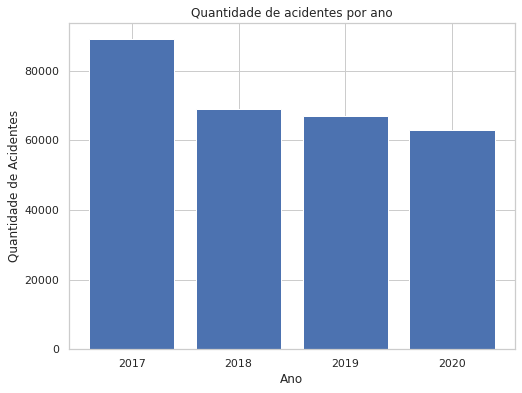

In [ ]:
ano = df.groupby(['id','ano'],as_index=False).count().iloc[:,range(2)]                 
plt.figure(figsize=(8,6))
plt.bar(np.arange(4), ano['ano'].value_counts())
ticks = plt.xticks(np.arange(4), ano['ano'].value_counts().index)
plt.title('Quantidade de acidentes por ano')
plt.ylabel('Quantidade de Acidentes')
plt.xlabel('Ano')

Text(0, 0.5, 'Dias da Semana')

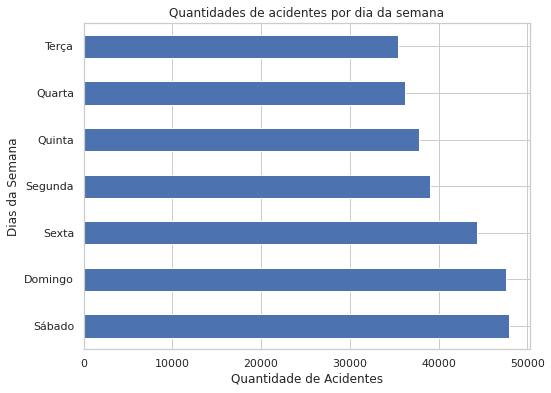

In [ ]:
diaSemana = df.groupby(['id','dia_semana'],as_index=False).count().iloc[:,range(2)]
diaSemana['dia_semana'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.title('Quantidades de acidentes por dia da semana');
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Dias da Semana')


Text(0, 0.5, 'Tipos de Acidentes')

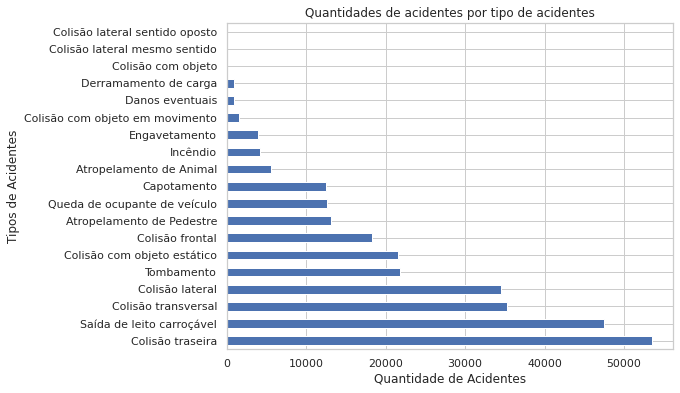

In [ ]:
tipoAcidente = df.groupby(['id','tipo_acidente'],as_index=False).count().iloc[:,range(2)]
tipoAcidente['tipo_acidente'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.title('Quantidades de acidentes por tipo de acidentes')
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Tipos de Acidentes')


Text(0.5, 30.5, 'Classificação dos Acidentes')

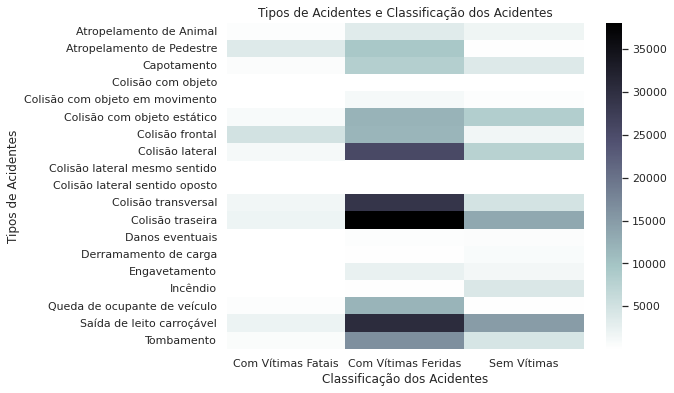

In [ ]:
tipoClassifAgrupId = df.groupby(['id','tipo_acidente','classificacao_acidente'],as_index=False).count().iloc[:,range(3)]
tipoClassif = tipoClassifAgrupId.groupby(['tipo_acidente','classificacao_acidente']).size().unstack()
plt.figure(figsize=(8,6))
sns.heatmap(tipoClassif, cmap='bone_r')
plt.title('Tipos de Acidentes e Classificação dos Acidentes')
plt.ylabel('Tipos de Acidentes')
plt.xlabel('Classificação dos Acidentes')

Text(0.5, 0, 'Fase do Dia')

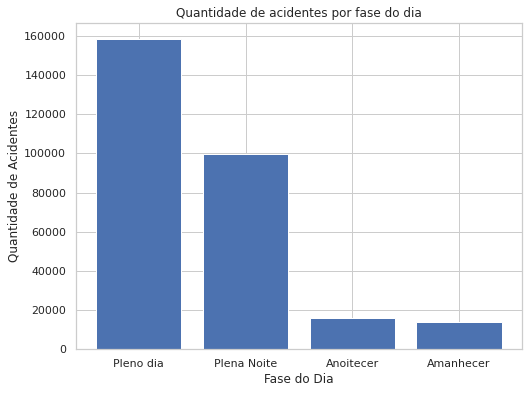

In [ ]:
fasedia = df.groupby(['id','fase_dia'],as_index=False).count().iloc[:,range(2)]
plt.figure(figsize=(8,6))
plt.bar(np.arange(4), fasedia['fase_dia'].value_counts())
ticks = plt.xticks(np.arange(4), fasedia['fase_dia'].value_counts().index)
plt.title('Quantidade de acidentes por fase do dia')
plt.ylabel('Quantidade de Acidentes')
plt.xlabel('Fase do Dia')

Text(48.5, 0.5, 'Fases do Dia')

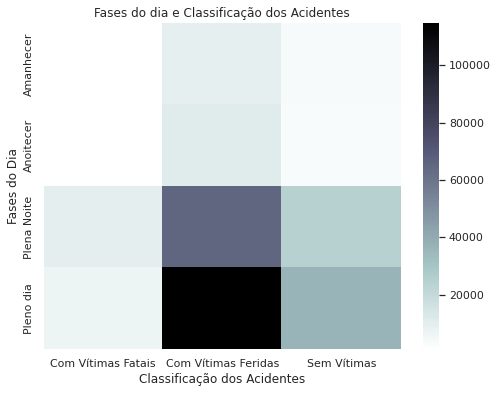

In [ ]:
faseClfId = df.groupby(['id','fase_dia','classificacao_acidente'],as_index=False).count().iloc[:,range(3)]
faseClf = faseClfId.groupby(['fase_dia','classificacao_acidente']).size().unstack()
plt.figure(figsize=(8,6))
sns.heatmap(faseClf, cmap='bone_r')
plt.title('Fases do dia e Classificação dos Acidentes')
plt.xlabel('Classificação dos Acidentes')
plt.ylabel('Fases do Dia')

Text(0, 0.5, 'Estados')

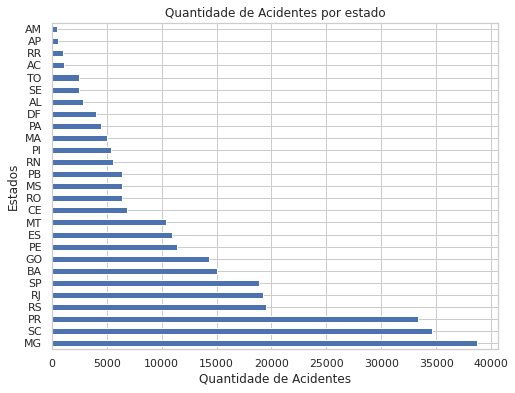

In [ ]:
estados = df.groupby(['id','uf'],as_index=False).count().iloc[:,range(2)]        
estados['uf'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.title('Quantidade de Acidentes por estado');
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Estados')

Text(48.5, 0.5, 'Estados')

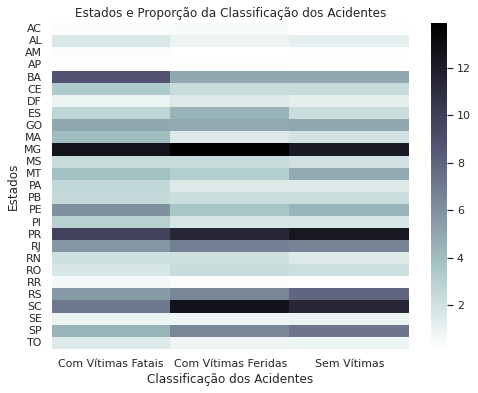

In [ ]:
estclfId = df.groupby(['id','uf','classificacao_acidente'],as_index=False).count().iloc[:,range(3)]
estclf = estclfId.groupby(['uf','classificacao_acidente']).size().unstack()
estclfProp = {}
for i, row in estclf.iteritems():
    estclfProp[i] = row*100/row.sum()
estclfProp = pd.DataFrame(estclfProp)
plt.figure(figsize=(8,6))
sns.heatmap(estclfProp, cmap='bone_r')
plt.title('Estados e Proporção da Classificação dos Acidentes')
plt.xlabel('Classificação dos Acidentes')
plt.ylabel('Estados')

Text(0, 0.5, 'Quantidade de Acidentes')

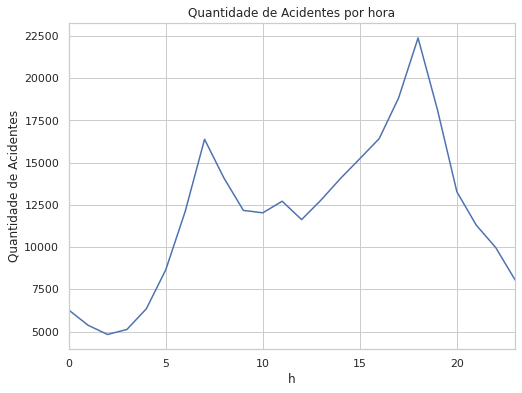

In [ ]:
hora = df.groupby(['id','horario'],as_index=False).count().iloc[:,range(2)]
hora['horario'] = hora['horario'].astype(str).apply(lambda x: x.split(':')[0]).astype(int)
acidentesHora = hora['horario'].value_counts()
plt.figure(figsize=(8,6))
plt.plot(acidentesHora.sort_index())
plt.xlim(0, 23)
plt.title('Quantidade de Acidentes por hora')
plt.xlabel('h')
plt.ylabel('Quantidade de Acidentes')

Text(0, 0.5, 'Condições Meteorológicas')

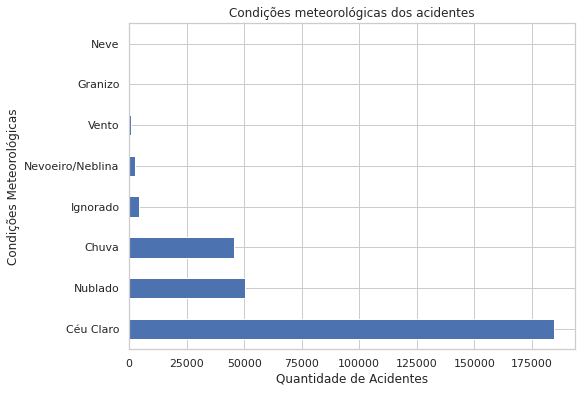

In [ ]:
cond = df.groupby(['id','condicao_metereologica'],as_index=False).count().iloc[:,range(2)]
cond['condicao_metereologica'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.title('Condições meteorológicas dos acidentes');
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Condições Meteorológicas')

Text(48.49999999999999, 0.5, 'Condições Meteorológicas')

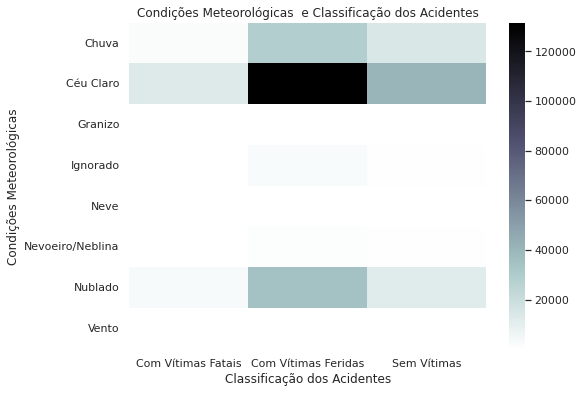

In [ ]:
condClfId = df.groupby(['id','condicao_metereologica','classificacao_acidente'],as_index=False).count().iloc[:,range(3)]
condClf = condClfId.groupby(['condicao_metereologica','classificacao_acidente']).size().unstack()
plt.figure(figsize=(8,6))
sns.heatmap(condClf, cmap='bone_r')
plt.title('Condições Meteorológicas  e Classificação dos Acidentes')
plt.xlabel("Classificação dos Acidentes")
plt.ylabel("Condições Meteorológicas")

Text(0, 0.5, 'BR')

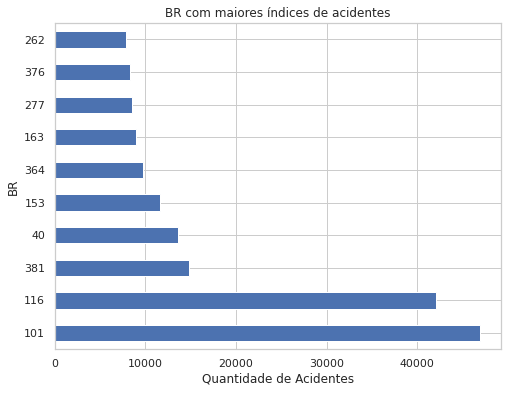

In [ ]:
br = df.groupby(['id','br'],as_index=False).count().iloc[:,range(2)]             
plt.figure(figsize=(8,6))
br['br'].value_counts().head(10).plot.barh()
plt.title('BR com maiores índices de acidentes');
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('BR')

Text(0, 0.5, 'Quantidade de Pessoas')

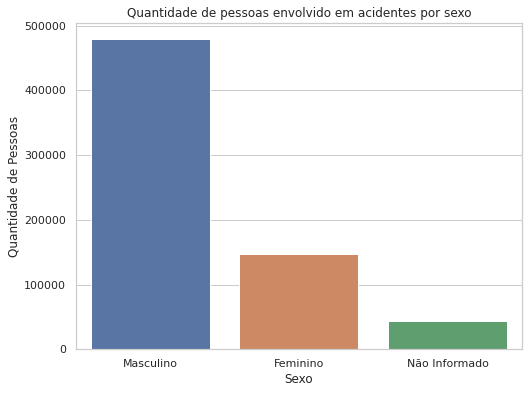

In [ ]:
sexo = df['sexo'].value_counts()
plt.figure(figsize=(8,6))
sns.barplot(sexo.index, sexo.values)
plt.title('Quantidade de pessoas envolvido em acidentes por sexo')              
plt.xlabel('Sexo')
plt.ylabel('Quantidade de Pessoas')

Text(0, 0.5, 'Quantidade de Pessoas')

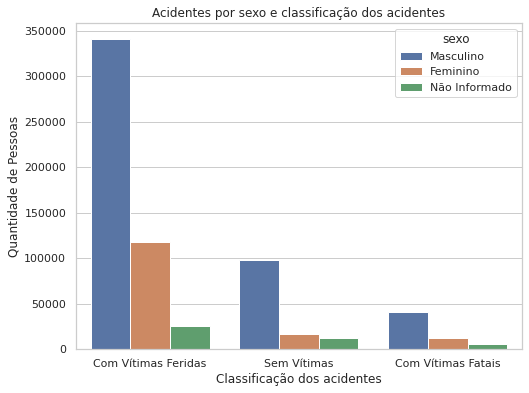

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='classificacao_acidente', data=df, hue='sexo')
plt.title('Acidentes por sexo e classificação dos acidentes')              
plt.xlabel('Classificação dos acidentes')
plt.ylabel('Quantidade de Pessoas')

Text(48.49999999999999, 0.5, 'Sexo')

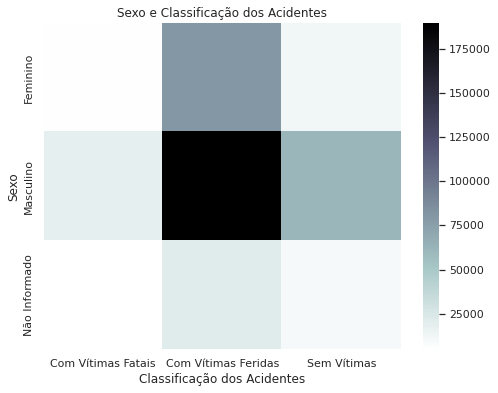

In [ ]:
sexoClfId = df.groupby(['id','sexo','classificacao_acidente'],as_index=False).count().iloc[:,range(3)]
sexoClf = sexoClfId.groupby(['sexo','classificacao_acidente']).size().unstack()
plt.figure(figsize=(8,6))
sns.heatmap(sexoClf, cmap='bone_r')
plt.title('Sexo e Classificação dos Acidentes')
plt.xlabel("Classificação dos Acidentes")
plt.ylabel("Sexo")

Text(0, 0.5, 'Municípios')

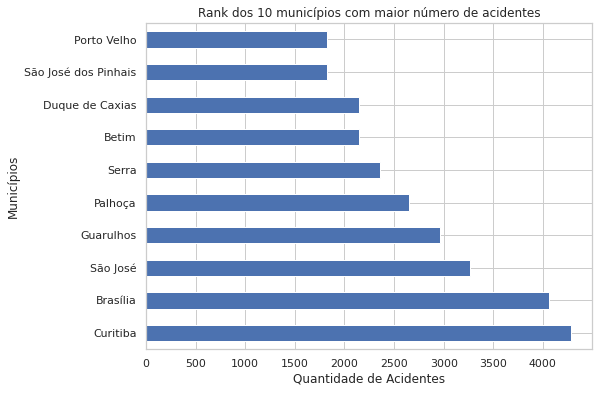

In [ ]:
.groupby(['id','municipio'],as_index=False).count().iloc[:,range(2)]             
plt.figure(figsize=(8,6))
mun['municipio'].value_counts().head(10).plot.barh()
plt.title('Rank dos 10 municípios com maior número de acidentes');
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Municípios')

Text(0, 0.5, 'Municípios')

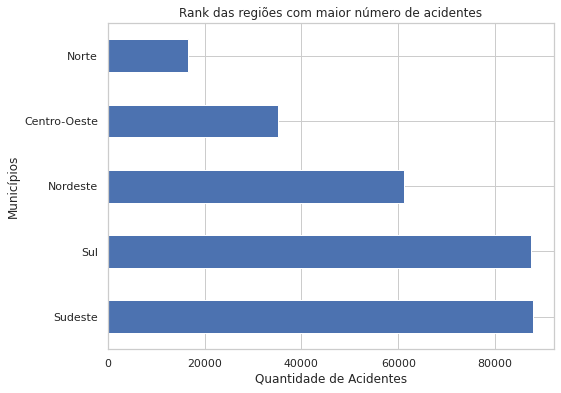

In [ ]:
regiao = df.groupby(['id','regiao_nome'],as_index=False).count().iloc[:,range(2)]             
plt.figure(figsize=(8,6))
regiao['regiao_nome'].value_counts().plot.barh()
plt.title('Rank das regiões com maior número de acidentes')
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Regiões')

Text(0, 0.5, 'Microregiões')

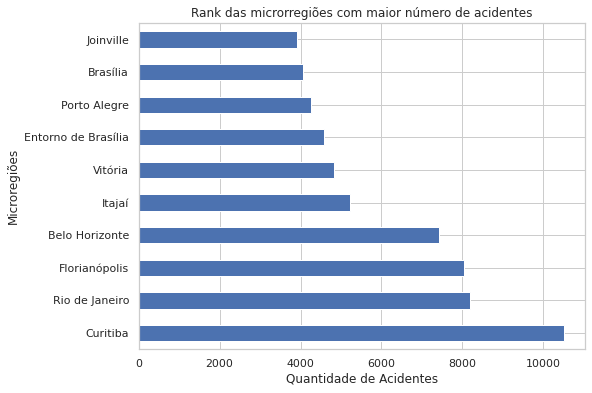

In [ ]:
micro = df.groupby(['id','microrregiao_nome'],as_index=False).count().iloc[:,range(2)]             
plt.figure(figsize=(8,6))
micro['microrregiao_nome'].value_counts().head(10).plot.barh()
plt.title('Rank das microrregiões com maior número de acidentes')
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Microregiões')

Text(0, 0.5, 'Mesoregiões')

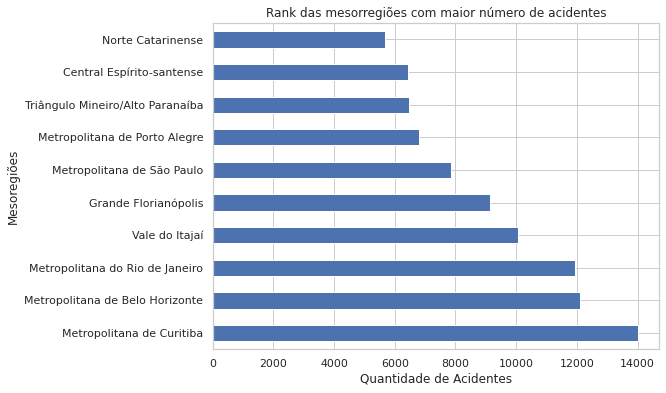

In [ ]:
meso = df.groupby(['id','mesorregiao_nome'],as_index=False).count().iloc[:,range(2)]             
plt.figure(figsize=(8,6))
meso['mesorregiao_nome'].value_counts().head(10).plot.barh()
plt.title('Rank das mesorregiões com maior número de acidentes')
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Mesoregiões')

Text(0, 0.5, 'Feriados')

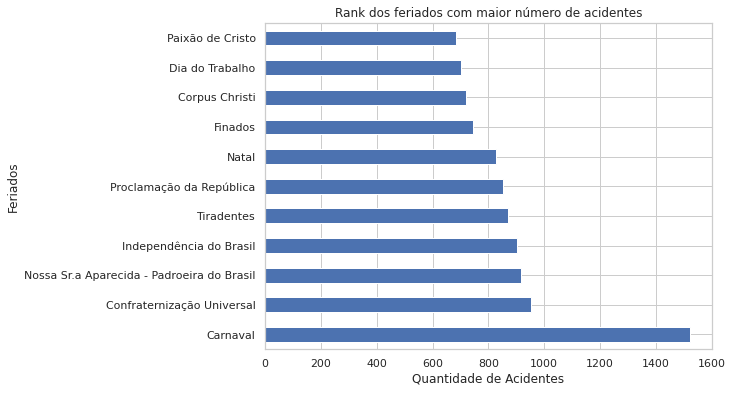

In [ ]:
feriados = df.groupby(['id','feriado'],as_index=False).count().iloc[:,range(2)] 
feriados = feriados[(feriados['feriado'] != "Dia Normal")]
plt.figure(figsize=(8,6))
feriados['feriado'].value_counts().plot.barh()
plt.title('Rank dos feriados com maior número de acidentes')
plt.xlabel('Quantidade de Acidentes')
plt.ylabel('Feriados')

In [ ]:
coor = df.groupby(['id','latitude','longitude'],as_index=False).count().iloc[:,range(3)]
coordenadas=[]
for lat,lng in zip(coor['latitude'].values,coor['longitude'].values):
    coordenadas.append([lat,lng])
mapa = folium.Map(location=[-15.788497,-47.879873],zoom_start=3,tiles='Stamen Terrain')
mapa.add_child(plugins.HeatMap(coordenadas))  
mapa

# 5.Criação de Modelos de Machine Learning

In [ ]:
np.random.seed = 42

cols = ['id','dia_semana','uf', 'br', 'fase_dia', 'condicao_metereologica', 
        'tracado_via','idade','sexo','regiao','microrregiao','mesorregiao',
        'feriado','classificacao']
df_acor = df[cols]

x = pd.get_dummies(df_acor.drop(['classificacao'], axis=1))
y = df_acor['classificacao']

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                        test_size = 0.2,
                                                        stratify = y)

##5.1 Floresta aleatória(Random Forest)##

In [ ]:
model = RandomForestClassifier(verbose=1, n_jobs=-1)                              

parameters = {
    'n_estimators': [10, 100],
    'criterion': ['gini', 'entropy'], 
    'max_features': ['sqrt', 'auto', 'log2', None],
    'class_weight': ['balanced', None],
}

scorer = make_scorer(score_func=accuracy_score)
grid_obj = GridSearchCV(model, parameters, scoring=scorer)
grid_fit = grid_obj.fit(x_train, y_train)

modelo = grid_fit.best_estimator_

pickle.dump(modelo, open('RandomForest.sav','wb'))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   10.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    8.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.9s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 o

NameError: ignored

In [ ]:
!wget 'https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/RandomForest.zip'
!unzip RandomForest.zip

model = _pickle.load(open('RandomForest.sav','rb'))

--2021-09-29 01:32:15--  https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/RandomForest.zip
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460221225 (439M) [application/zip]
Saving to: ‘RandomForest.zip’

RandomForest.zip    100%[===================>] 438.90M   268MB/s    in 1.6s    

2021-09-29 01:32:17 (268 MB/s) - ‘RandomForest.zip’ saved [460221225/460221225]

Archive:  RandomForest.zip
  inflating: RandomForest.sav        


In [ ]:
model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='log2',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=1,
                       warm_start=False)

In [ ]:
y_pred = model.predict(x_test)0

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    3.2s finished


In [ ]:
accuracy = accuracy_score(y_test, y_pred) * 100
print("A acurácia foi %.2f%%" % accuracy)

A acurácia foi 95.96%


Confusion matrix, without normalization
[[22395  3068    70]
 [  773 95959   168]
 [  110  1242 10539]]


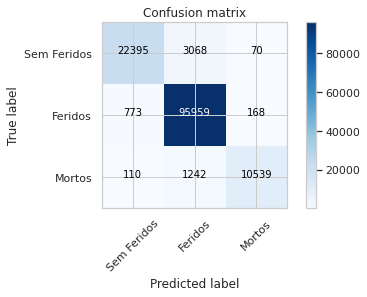

In [ ]:
cnf_matrix = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cnf_matrix, classes=['Sem Feridos', 'Feridos', 'Mortos'],
                      title='Confusion matrix')

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92     25533
           1       0.96      0.99      0.97     96900
           2       0.98      0.89      0.93     11891

    accuracy                           0.96    134324
   macro avg       0.97      0.92      0.94    134324
weighted avg       0.96      0.96      0.96    134324



##5.2 Regressão logística(LogisticRegression)##

In [ ]:
model = LogisticRegression()                                                     

parameters = {
    'penalty': ['l1', 'l2'],
    'C': [0.1, 0.5, 1., 1.5],
    'class_weight': ['balanced', None, {0: 0.3, 1: 0.2, 2: 0.5}]
}

scorer = make_scorer(score_func=accuracy_score)
grid_obj = GridSearchCV(model, parameters, scoring=scorer)
grid_fit = grid_obj.fit(x_train, y_train)

model = grid_fit.best_estimator_

pickle.dump(modelo, open('LogisticRegression.sav','wb'))

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
60 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 449, in _check_solver
    % (solver, penalty)
ValueError: Solve

In [ ]:
# Modelo já treinado no repositório do projeto
!wget 'https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/LogisticRegression.zip'
!unzip LogisticRegression.zip

model = _pickle.load(open('LogisticRegression.sav','rb'))

--2021-09-29 00:34:50--  https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/LogisticRegression.zip
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2693 (2.6K) [application/zip]
Saving to: ‘LogisticRegression.zip’

LogisticRegression. 100%[===================>]   2.63K  --.-KB/s    in 0s      

2021-09-29 00:34:50 (46.7 MB/s) - ‘LogisticRegression.zip’ saved [2693/2693]

Archive:  LogisticRegression.zip
  inflating: LogisticRegression.sav  


In [ ]:
model

LogisticRegression(C=0.1)

In [ ]:
y_pred = model.predict(x_test)                                                   

In [ ]:
accuracy = accuracy_score(y_test, y_pred) * 100
print("A acurácia foi %.2f%%" % accuracy)

A acurácia foi 72.14%


Confusion matrix, without normalization
[[    0 25533     0]
 [    0 96900     0]
 [    0 11891     0]]


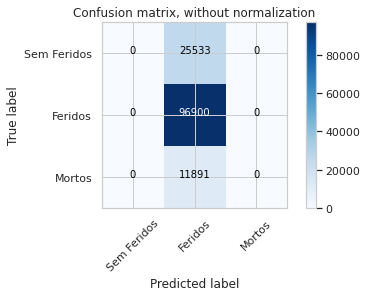

In [ ]:
cnf_matrix = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cnf_matrix, classes=['Sem Feridos', 'Feridos', 'Mortos'],
                      title='Confusion matrix, without normalization')

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     25533
           1       0.72      1.00      0.84     96900
           2       0.00      0.00      0.00     11891

    accuracy                           0.72    134324
   macro avg       0.24      0.33      0.28    134324
weighted avg       0.52      0.72      0.60    134324



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##5.3 KMeans##

In [ ]:
model = KNeighborsClassifier()

parameters = {
    'n_neighbors': [3,5,11,19],
    'weights': ['uniform','distance'],
    'metric': ['euclidean','manhattan']
}

scorer = make_scorer(score_func=accuracy_score)
grid_obj = GridSearchCV(model, parameters, scoring=scorer)
grid_fit = grid_obj.fit(x_train, y_train)

modelo = grid_fit.best_estimator_

pickle.dump(modelo, open('KMeans.sav','wb'))

In [ ]:
# Modelo já treinado no repositório do projeto
!wget 'https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/KMeans.zip'
!unzip KMeans.zip

model = _pickle.load(open('KMeans.sav','rb'))

--2021-09-29 01:25:19--  https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/KMeans.zip
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26370546 (25M) [application/zip]
Saving to: ‘KMeans.zip’

KMeans.zip          100%[===================>]  25.15M  25.0MB/s    in 1.0s    

2021-09-29 01:25:21 (25.0 MB/s) - ‘KMeans.zip’ saved [26370546/26370546]

Archive:  KMeans.zip
  inflating: KMeans.sav              


In [ ]:
model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='distance')

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred) * 100
print("A acurácia foi %.2f%%" % accuracy)

A acurácia foi 97.70%


Confusion matrix, without normalization
[[24009  1393   131]
 [  912 95677   311]
 [   64   285 11542]]


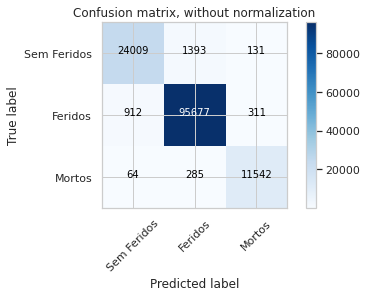

In [ ]:
cnf_matrix = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cnf_matrix, classes=['Sem Feridos', 'Feridos', 'Mortos'],
                      title='Confusion matrix, without normalization')

In [ ]:
print(classification_report(y_test, y_pred))                                     

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     25533
           1       0.98      0.99      0.99     96900
           2       0.96      0.97      0.97     11891

    accuracy                           0.98    134324
   macro avg       0.97      0.97      0.97    134324
weighted avg       0.98      0.98      0.98    134324



In [ ]:
model = HistGradientBoostingClassifier()
model.get_params().keys()


dict_keys(['categorical_features', 'early_stopping', 'l2_regularization', 'learning_rate', 'loss', 'max_bins', 'max_depth', 'max_iter', 'max_leaf_nodes', 'min_samples_leaf', 'monotonic_cst', 'n_iter_no_change', 'random_state', 'scoring', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [ ]:
model = HistGradientBoostingClassifier()

parameters = {
    'learning_rate': (0.01, 0.1, 1, 10),
    'max_leaf_nodes': (3, 10, 30)
}

scorer = make_scorer(score_func=accuracy_score)
grid_obj = GridSearchCV(model, parameters, scoring=scorer, n_jobs=-1)
grid_fit = grid_obj.fit(x_train, y_train)

modelo = grid_fit.best_estimator_

pickle.dump(modelo, open('GradientBoosting.sav','wb'))

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
# Modelo já treinado no repositório do projeto
!wget 'https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/GradientBoosting.zip'
!unzip GradientBoosting.zip

model = _pickle.load(open('GradientBoosting.sav','rb'))

--2021-09-29 03:18:42--  https://gitlab.com/callacius/tcc_puc/-/raw/master/modelos/GradientBoosting.zip
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 445770 (435K) [application/zip]
Saving to: ‘GradientBoosting.zip’

GradientBoosting.zi 100%[===================>] 435.32K  2.10MB/s    in 0.2s    

2021-09-29 03:18:43 (2.10 MB/s) - ‘GradientBoosting.zip’ saved [445770/445770]

Archive:  GradientBoosting.zip
  inflating: GradientBoosting.sav    


In [ ]:
model

HistGradientBoostingClassifier(max_leaf_nodes=30)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred) * 100
print("A acurácia foi %.2f%%" % accuracy)

A acurácia foi 72.69%


Confusion matrix, without normalization
[[ 1235 24287    11]
 [  764 96116    20]
 [  122 11485   284]]


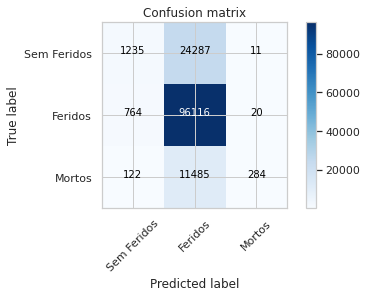

In [ ]:
cnf_matrix = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cnf_matrix, classes=['Sem Feridos', 'Feridos', 'Mortos'],
                      title='Confusion matrix')

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.58      0.05      0.09     25533
           1       0.73      0.99      0.84     96900
           2       0.90      0.02      0.05     11891

    accuracy                           0.73    134324
   macro avg       0.74      0.35      0.33    134324
weighted avg       0.72      0.73      0.63    134324

